# Project CV - 2. Object detection

## Faster R-CNN을 사용해서 object detection
`Faster R-CNN`
- 논문 : [Faster R-CNN: Towards Real-Time Object Detection with Region Proposal Networks](https://arxiv.org/pdf/1506.01497.pdf)

**RCNN vs Fast R-CNN vs Faster R-CNN**
- 2 stage detector(Region Proposal, Classification/Bounding Box Regression)
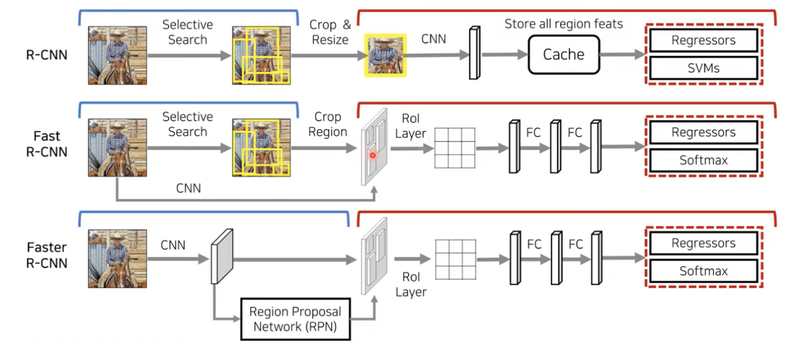

**Faster R-CNN의 구조**
- RCNN, Fast RCNN과 Faster RCNN의 가장 큰 차이점은 *Selective Search*를 **Region Proposal Network(RPN)** 로 바꾸었다는 것
- RPN은 RoI가 될 후보군인 Anchor Box를 무수히 만든다
- 그 후 Bounding Box Regression를 통해서 괜찮은 RoI를 딥러닝을 통해 학습하고 Classification을 통해 그것이 Object인지 아닌지를 판단한다
- RPN을 통해 얻은 결과에 Object Classification을 통해서 해당 RoI에 있는 Object가 어떤 Class인지 구분하고, Bounding Box Regression을 실행한다
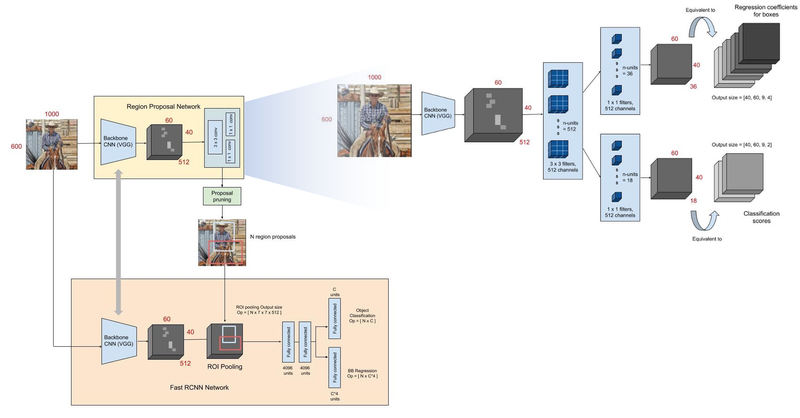

---
## 코드 살펴보기
- 해당 코드는 [텐서플로우 공식 홈페이지의 튜토리얼](https://www.tensorflow.org/hub/tutorials/object_detection?hl=ko)에서 제시된 코드를 활용

In [14]:
# !pip3 install tensorflow-estimator==2.6.0

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 462.9/462.9 kB 1.6 MB/s eta 0:00:00m eta 0:00:010:01:01
  Attempting uninstall: tensorflow-estimator
    Found existing installation: tensorflow-estimator 2.15.0
    Uninstalling tensorflow-estimator-2.15.0:
      Successfully uninstalled tensorflow-estimator-2.15.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-macos 2.15.0 requires tensorflow-estimator<2.16,>=2.15.0, but you have tensorflow-estimator 2.6.0 which is incompatible.


In [16]:
# Tensorflow와 Tensoflow Hub에 있는 이미 학습된 모델을 활용하기 위한 모듈 
import tensorflow as tf
# import tensorflow_hub as hub

# 이미지를 다운로드하는 데에 사용하는 모듈
import matplotlib.pyplot as plt
import tempfile 
from six.moves.urllib.request import urlopen
from six import BytesIO

# 이미지에 선과 폰트를 넣기 위한 모듈
import numpy as np
from PIL import Image
from PIL import ImageColor
from PIL import ImageDraw
from PIL import ImageFont
from PIL import ImageOps

# Detection하는 데에 소요된 시간을 점검하기 위한 모듈
import time

In [17]:
# 이미지를 시각화하는 함수
def display_image(image):
    fig = plt.figure(figsize=(20, 15))
    plt.grid(False)
    plt.imshow(image)

In [18]:
# 원하는 이미지를 다운로드하고 정해진 가로, 세로 길이에 맞게 이미지를 resizing하는 함수
def download_and_resize_image(url, new_width=256, new_height=256, display=False): 
    _, filename = tempfile.mkstemp(suffix=".jpg")
    response = urlopen(url)
    image_data = response.read()
    image_data = BytesIO(image_data)  # 이미지 읽기
    pil_image = Image.open(image_data)
    pil_image = ImageOps.fit(pil_image, (new_width, new_height), Image.ANTIALIAS) # 이미지 조정
    pil_image_rgb = pil_image.convert("RGB") #RBG로 변환
    pil_image_rgb.save(filename, format="JPEG", quality=90) # 이미지 저장
    print("Image downloaded to %s." % filename)
    if display:
        display_image(pil_image)
    return filename

In [7]:
# Bounding box 만드는 함수
def draw_bounding_box_on_image(image, 
                               ymin, xmin, ymax, xmax,
                               color,
                               font,
                               thickness=4,
                               display_str_list=()):
  
    draw = ImageDraw.Draw(image)
    im_width, im_height = image.size
    (left, right, top, bottom) = (xmin * im_width, xmax * im_width,
                                ymin * im_height, ymax * im_height)

    # BBox 테두리 그리기
    draw.line([(left, top), (left, bottom), (right, bottom), (right, top),
             (left, top)], width=thickness, fill=color)

    display_str_heights = [font.getsize(ds)[1] for ds in display_str_list]

    total_display_str_height = (1 + 2 * 0.05) * sum(display_str_heights)

    if top > total_display_str_height:
        text_bottom = top
    else:
        text_bottom = top + total_display_str_height

    for display_str in display_str_list[::-1]:
        text_width, text_height = font.getsize(display_str)
        margin = np.ceil(0.05 * text_height)
        draw.rectangle([(left, text_bottom - text_height - 2 * margin),
                        (left + text_width, text_bottom)],
                       fill=color)
        draw.text((left + margin, text_bottom - text_height - margin),
                  display_str,
                  fill="black",
                  font=font)
        text_bottom -= text_height - 2 * margin

In [9]:
# 이미지 위에 class 이름과 score를 나타내는 함수
# BBox 그리기
def draw_boxes(image, boxes, class_names, scores, max_boxes=10, min_score=0.1): 
    colors = list(ImageColor.colormap.values())

    try:
        font = ImageFont.truetype("/usr/share/fonts/truetype/liberation/LiberationSansNarrow-Regular.ttf", 25)
    except IOError:
        print("Font not found, using default font.")
        font = ImageFont.load_default()

    # BBox 그리기 적용
    for i in range(min(boxes.shape[0], max_boxes)):
        if scores[i] >= min_score:
            ymin, xmin, ymax, xmax = tuple(boxes[i])  # 박스 좌표값
            display_str = "{}: {}%".format(class_names[i].decode("ascii"), int(100 * scores[i]))
            color = colors[hash(class_names[i]) % len(colors)]
            image_pil = Image.fromarray(np.uint8(image)).convert("RGB")
            draw_bounding_box_on_image(image_pil, ymin, xmin, ymax, xmax, 
                                       color, font, display_str_list=[display_str])
            np.copyto(image, np.array(image_pil))
    return image

### 이미지에 적용

Image downloaded to /tmp/tmpepls06i8.jpg.


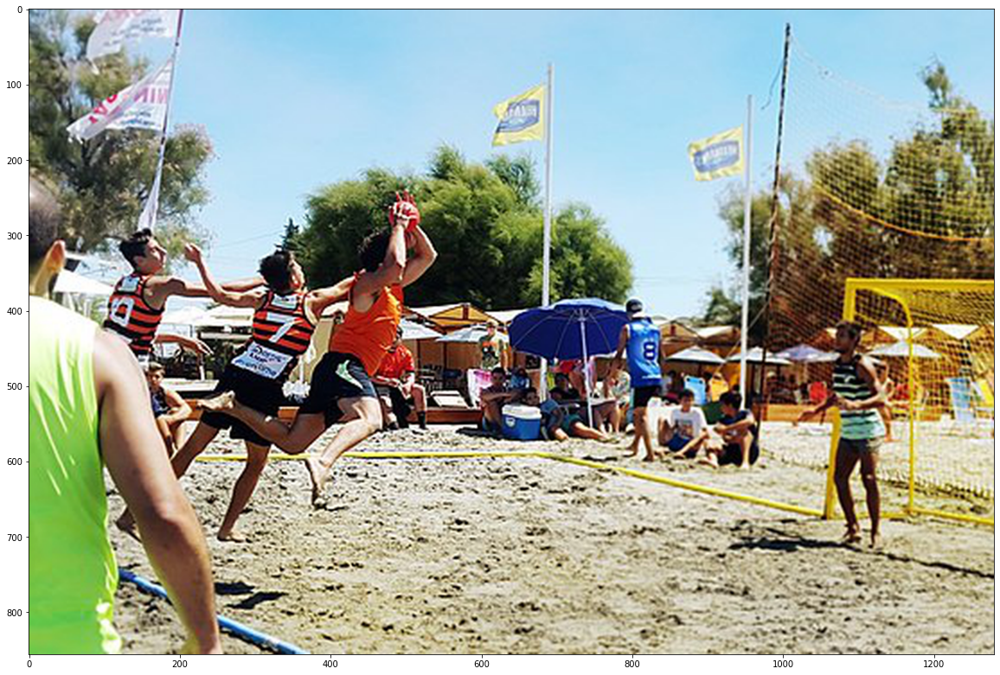

In [10]:
# 원하는 이미지를 불러오고, 가로와 세로를 변경하는 실험 진행
image_url = "https://upload.wikimedia.org/wikipedia/commons/thumb/d/db/Torneo_beach_handball.jpg/640px-Torneo_beach_handball.jpg"
downloaded_image_path = download_and_resize_image(image_url, 1280, 856, True)  # new_width와 new_height를 변경해 보세요.

## Pre-trained model 불러오기
- Faster R-CNN
    - [tfhub](https://tfhub.dev/)에서 사전 학습된(Pre-trained) [InceptionResnet](https://arxiv.org/pdf/1602.07261v2.pdf) 모델을 사용

In [11]:
# faster R-CNN - InceptionResnet모델
module_handle = "https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1"  

# detector에 사용할 모듈 저장
detector = hub.load(module_handle).signatures['default'] 

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


In [12]:
# 이미지 로드 함수
def load_img(path):
    img = tf.io.read_file(path)
    img = tf.image.decode_jpeg(img, channels=3)
    return img

In [13]:
# Detector 실행 함수
def run_detector(detector, path):
    img = load_img(path) 

    converted_img  = tf.image.convert_image_dtype(img, tf.float32)[tf.newaxis, ...]

    # 소요시간 측정
    start_time = time.time()
    result = detector(converted_img)
    end_time = time.time()

    result = {key:value.numpy() for key,value in result.items()}

    # 이미지 추론 개수와 추론 시간 출력
    print("Found %d objects." % len(result["detection_scores"]))
    print("Inference time: ", end_time-start_time)

    # 이미지 내 박스로 entity, scores를 추가하여 출력
    image_with_boxes = draw_boxes(
      img.numpy(), result["detection_boxes"],
      result["detection_class_entities"], result["detection_scores"])

    display_image(image_with_boxes)

Found 100 objects.
Inference time:  47.99895644187927


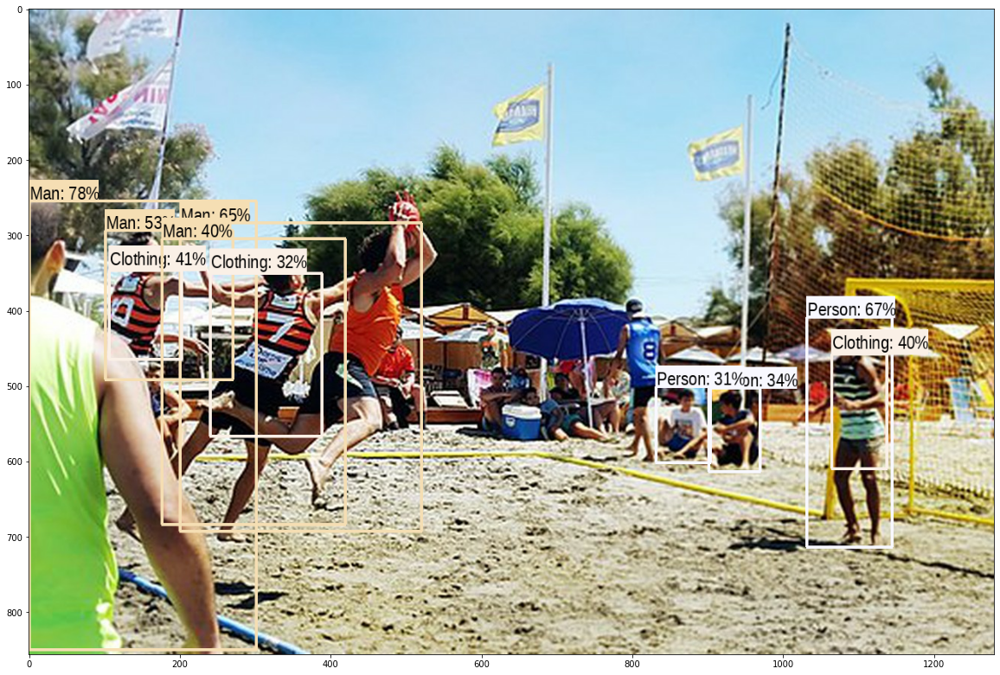

In [14]:
# detector 실행
run_detector(detector, downloaded_image_path)

- 사람, 옷, 남자를 구별하는 bbox가 만들어졌다.

---
### 문제 2-1. 다른 이미지 테스트해보기
- 원하는 이미지를 불러와서 결과를 확인

Image downloaded to /tmp/tmpkwpkor6b.jpg.
Found 100 objects.
Inference time:  1.4287109375


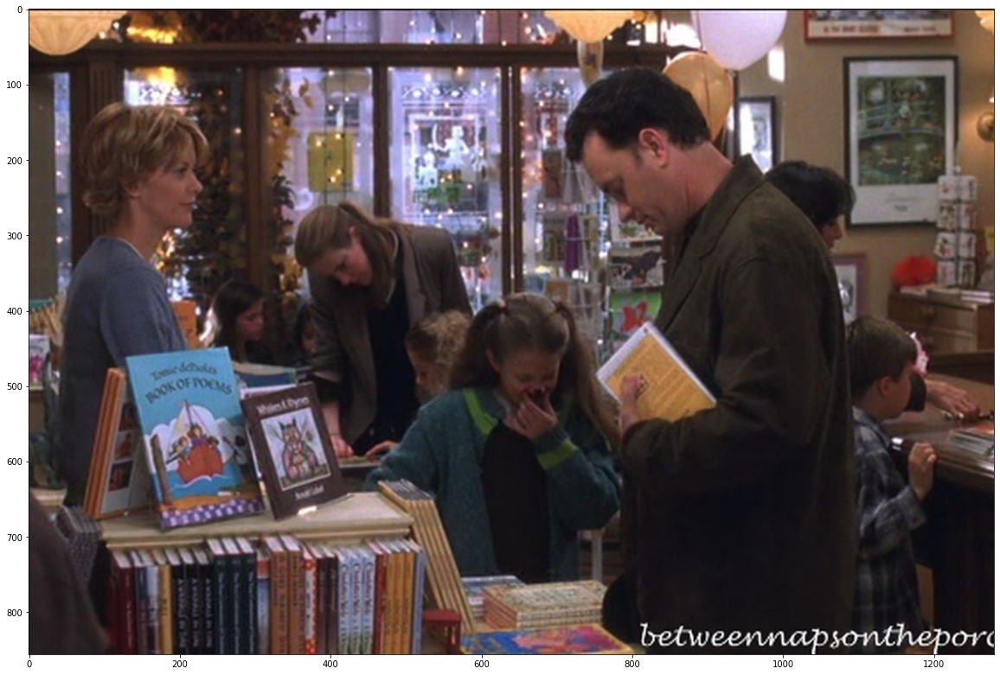

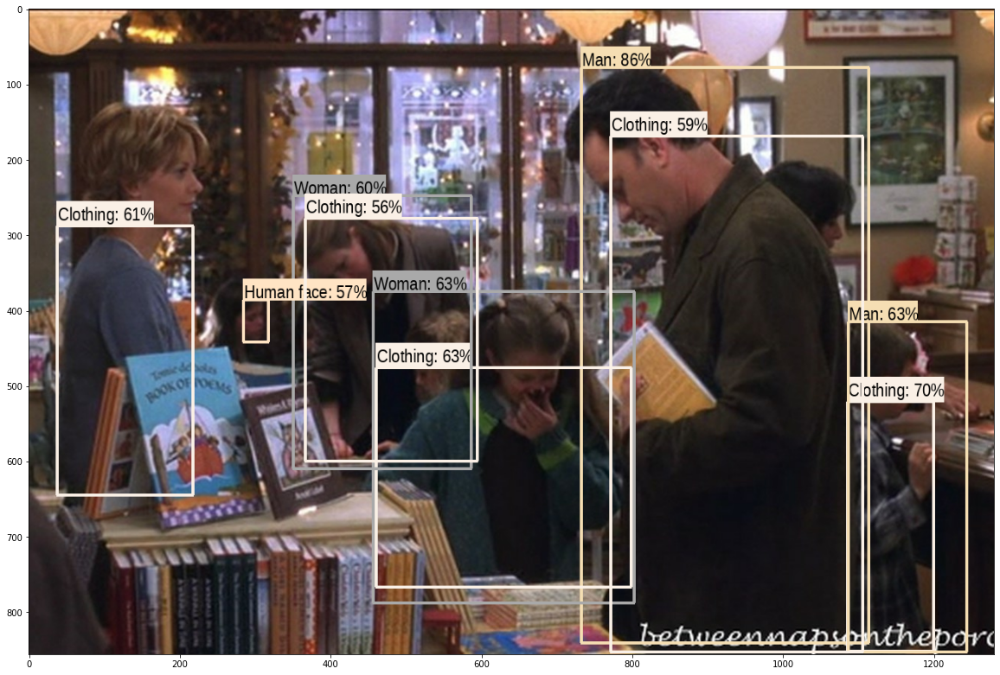

In [21]:
image = 'https://8888-wcqgqq63fol6t6te78p3tjkmz.container-server-prod.aiffel.io/files/aiffel/workplace/DL/The-Shop-Around-the-Corner-bookstore-in-Movie-Youve-Got-Mail-1.jpg'
downloaded_image_path = download_and_resize_image(image, 1280, 856, True)

run_detector(detector, downloaded_image_path)

- bbox가 clothing, human face, woman, man 이렇게 4부분이 생겼다. 
- 여성얼굴도 인식하긴하는데, 머리가 짧으면 여성으로 인식하지 못하는것같다.
- 꽤 작은 부분의 얼굴도 인식한다.

### 문제 2-2. 다양한 pre-trained model 테스트해보기
- [tfhub](https://tfhub.dev/)에서 Object Detection을 할 수 있는 다양한 사전 학습 모델을 불러와서 테스트
- 위 주소를 접속하면 캐글 사이트로 자동 연결이 된다. 일단 여기에서 object detection을 할수 있는 모델을 고르기로했다.

~[YOLOV8](https://www.kaggle.com/models/keras/yolov8/frameworks/keras/variations/yolo_v8_xs_backbone)~   
~- YOLO ver.8를 의미하는 것 같다.~   
~- [kaggle notebook](https://www.kaggle.com/code/pepsissalom/object-detection) 참고해서 코드 작성~
- tensorflow와 다른 라이브러리 버전이 맞지 않는것같아서 다른 오래된 모델로 변경

#### [efficientdet](https://www.kaggle.com/models/tensorflow/efficientdet)
- EfficientDet Object detection model 
- SSD with EfficientNet-b0 + BiFPN feature extractor, shared box predictor and focal loss
- trained on COCO 2017 dataset

In [28]:
module_handle = "https://www.kaggle.com/models/tensorflow/efficientdet/frameworks/TensorFlow2/variations/d0/versions/1"

# detector에 사용할 모듈 저장
detector = hub.load(module_handle)

# detector 실행
run_detector(detector, downloaded_image_path)

ValueError: Python inputs incompatible with input_signature:
  inputs: (
    tf.Tensor(
[[[[0.12941177 0.         0.        ]
   [0.12941177 0.         0.        ]
   [0.13333334 0.         0.        ]
   ...
   [0.21568629 0.0627451  0.        ]
   [0.21176472 0.07058824 0.        ]
   [0.21568629 0.07450981 0.        ]]

  [[0.28235295 0.14117648 0.07843138]
   [0.28235295 0.14117648 0.07843138]
   [0.28235295 0.14117648 0.07843138]
   ...
   [0.36078432 0.20392159 0.0627451 ]
   [0.3647059  0.20784315 0.06666667]
   [0.3647059  0.20784315 0.06666667]]

  [[0.57254905 0.427451   0.3254902 ]
   [0.57254905 0.427451   0.3254902 ]
   [0.57254905 0.427451   0.3254902 ]
   ...
   [0.654902   0.47058827 0.30588236]
   [0.654902   0.47058827 0.30588236]
   [0.6509804  0.47450984 0.30980393]]

  ...

  [[0.14901961 0.1254902  0.13333334]
   [0.14901961 0.1254902  0.13333334]
   [0.15294118 0.12941177 0.13725491]
   ...
   [0.07843138 0.0627451  0.06666667]
   [0.07450981 0.05882353 0.0627451 ]
   [0.07450981 0.05882353 0.0627451 ]]

  [[0.15294118 0.12941177 0.13725491]
   [0.15294118 0.12941177 0.13725491]
   [0.15686275 0.13333334 0.14117648]
   ...
   [0.08235294 0.06666667 0.07058824]
   [0.08235294 0.06666667 0.07058824]
   [0.08235294 0.06666667 0.07058824]]

  [[0.15294118 0.12941177 0.13725491]
   [0.15294118 0.12941177 0.13725491]
   [0.15686275 0.13333334 0.14117648]
   ...
   [0.07843138 0.0627451  0.06666667]
   [0.08235294 0.06666667 0.07058824]
   [0.08627451 0.07058824 0.07450981]]]], shape=(1, 856, 1280, 3), dtype=float32))
  input_signature: (
    TensorSpec(shape=(1, None, None, 3), dtype=tf.uint8, name=None))

- 이미지사이즈가 맞지 않아서 에러가 난것같다. 
- 노드 코드 뒷부분을 삭제했는데 이 부분을 붙여서 다시 실행

In [29]:
detector = hub.load(module_handle).signatures['default'] # detector에 사용할 모듈 저장

KeyError: 'default'

- 이 부분은 삭제하고 실행하는게 맞는것같은데, 다른 모델을 시도해본다..🥲

---
#### [YOLOv5](https://www.kaggle.com/models/kaggle/yolo-v5)
- 많이 들어본 YOLO ver5를 사용 도전
- [yolov5 공식 문서 참고](https://docs.ultralytics.com/yolov5/quickstart_tutorial/)


===========================================   
라이브러리 설치 등의 버전문제때문에 여기에서부터 로컬실행

In [1]:
import torch

- 와 나의 첫 torch 사용
- 혹시 모르니 잘 실행되는지 확인

In [2]:
# torch 실행 체크
x = torch.rand(5, 3)
print(x)

tensor([[7.1114e-01, 4.5624e-01, 9.9551e-01],
        [1.4781e-01, 6.7096e-01, 7.7602e-01],
        [2.8461e-04, 8.5930e-01, 2.3868e-01],
        [6.6306e-01, 5.0872e-01, 7.0933e-01],
        [7.9496e-01, 1.8933e-01, 8.3259e-01]])


In [21]:
# Model loading
model = torch.hub.load("ultralytics/yolov5", "yolov5s")

# 이미지는 아까 사용한 이미지를 그대로 사용
image = 'https://images.mubicdn.net/images/film/15233/cache-33277-1641814578/image-w1280.jpg?size=600x'

# Run inference
results = model(image)

# Display results
results.print() 

Using cache found in /Users/seullee/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2023-12-28 Python-3.11.1 torch-2.1.2 CPU

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
image 1/1: 338x600 2 persons, 1 orange, 1 tv, 1 keyboard, 1 book
Speed: 144.9ms pre-process, 73.4ms inference, 14.2ms NMS per image at shape (1, 3, 384, 640)


- 와!
  > image 1/1: 338x600 2 persons, 1 orange, 1 tv, 1 keyboard, 1 book   
  > Speed: 144.9ms pre-process, 73.4ms inference, 14.2ms NMS per image at shape (1, 3, 384, 640)

- 출력을 해보자

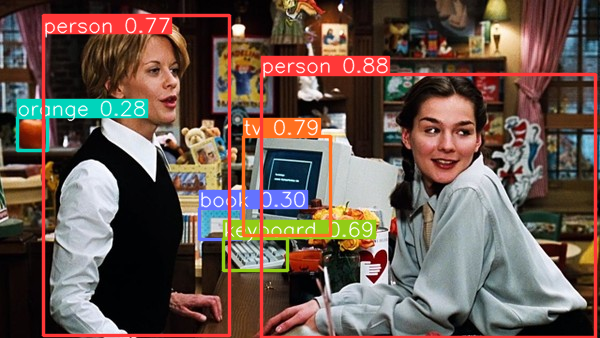

In [22]:
results.show()

- 오마이갓 저 뒤에 오렌지도 잡아냈다!(사실 호박이지만)
- 컴퓨터 모니터를 tv로 잡아냈지만 책도 읽어냈다.
- 재밌어서 다른 사진으로 다시 시도해본다


image 1/1: 600x1200 4 persons, 1 wine glass, 1 cup, 1 chair, 1 potted plant
Speed: 1652.1ms pre-process, 103.5ms inference, 1.0ms NMS per image at shape (1, 3, 320, 640)


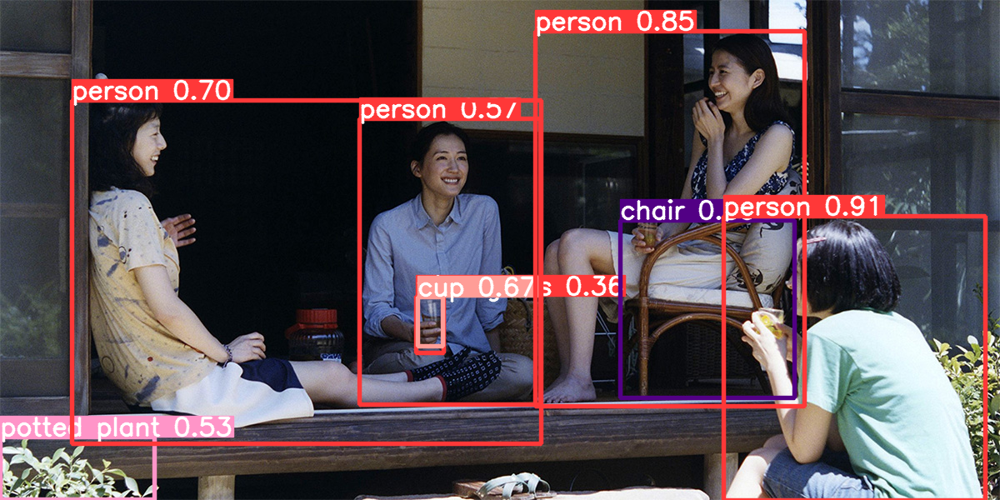

In [23]:
image2 = 'https://www.fareastfilms.com/wp-content/uploads/2017/05/Our-Little-Sister-1.jpg'

# Run inference
results = model(image2)

# Display results
results.print() 
results.show()

image 1/1: 1080x1920 5 persons, 3 chairs, 4 potted plants, 2 dining tables, 2 clocks
Speed: 276.1ms pre-process, 96.8ms inference, 0.5ms NMS per image at shape (1, 3, 384, 640)


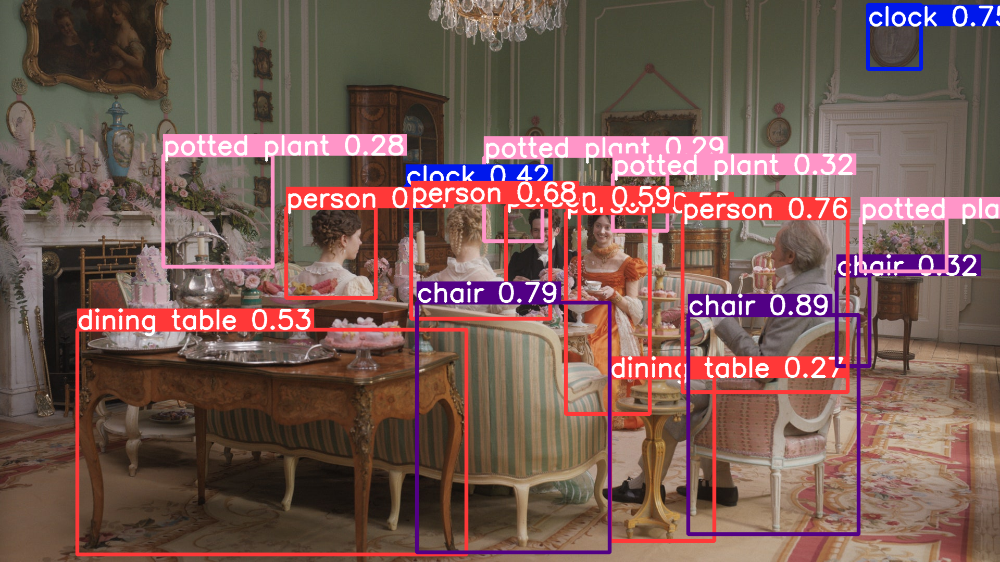

In [24]:
image3 = 'https://media.architecturaldigest.com/photos/5e44a3ea952b9f0009559355/16:9/w_1920,c_limit/E_FP_00083.JPG'

# Run inference
results = model(image3)

# Display results
results.print() 
results.show()


- 굉장히 많은 오브젝트도 잘 잡아낸다.


---
# Project CV 회고

**[KEEP]**   
- 포기하지않고 object detection 모델을 불러와서 결과를 확인했다.
- 에러문구가 나오면 기분은 나쁘지만😇 이전만큼 당황하지않고 에러 내용을 읽고 해야할 작업에 대해 생각하게 되었다.
- 포기할 부분은 빨리 포기하고 다른 방법을 시도하려고 하는데 꽤 잘하고 있다고 생각한다. 안되는 부분에 쉽게 매몰되는 성격이라 당장의 문제에 깊이 빠지지않고 일단 빠져나오는게 중요하기 때문이다.

**[PROBLEM]**      

- 여전히 공부해야할 부분이 많다. 주소로 불러온 이미지를 출력하는걸 해보려고 했는데 지치고 집중이 잘 되지않아서 마무리했다.
- 프로젝트 1에서 학습시간이 너무 오래 결리는 바람에 여러 시도를 하지 못했다. 

**[TRY]**   
- 마지막 그래프를 비교했을때 손실그래프가 조금 이상했다. 이 부분을 포함해서 프로젝트 1을 다시 한번 정리하면서 진행한다.
- 주소로 불러온 이미지 출력 방법에 대해 공부하고 출력해본다.
- 캐글의 다른 모델을 활용해서 object detection, segmentation 프로젝트를 진행해본다.